In [4]:
%pip install scikit-image
import os
import numpy as np
from skimage.io import imread
from skimage import img_as_float
import matplotlib.pyplot as plt

# ---------- CONFIGURATION ----------
IMAGE_ROOT = r'D:\all\images'
MASK_ROOT = r'D:\all\mask'

# ---------- STEP 1: PAIR IMAGE AND MASK FILENAMES ----------
# Create mapping: strip suffixes (_mask.tif, .jpg, .JPG) to match filenames
image_files = [f for f in os.listdir(IMAGE_ROOT) if f.lower().endswith(('.jpg', '.jpeg'))]
mask_files = [f for f in os.listdir(MASK_ROOT) if f.lower().endswith('.tif')]

def match_mask_filename(img_file):
    # e.g., 03_h.jpg -> 03_h_mask.tif
    base = os.path.splitext(img_file)[0]
    mask_candidate = base + '_mask.tif'
    return mask_candidate if mask_candidate in mask_files else None

paired_files = [
    (os.path.join(IMAGE_ROOT, img_file), os.path.join(MASK_ROOT, match_mask_filename(img_file)))
    for img_file in image_files if match_mask_filename(img_file) is not None
]

print(f'Found {len(paired_files)} image-mask pairs.')

# ---------- STEP 2: LOAD, APPLY MASK, GRAYSCALE, STANDARDIZE ----------
preprocessed_images = []
filenames_used = []
for img_path, mask_path in paired_files:
    img = img_as_float(imread(img_path))
    mask = imread(mask_path)
    # Normalize mask: ensure it's binary [0,1]
    if mask.max() > 1: mask = mask / 255.0
    mask = (mask > 0.5).astype(float)
    if mask.ndim == 2 and img.ndim == 3:
        mask = mask[..., np.newaxis]
    img_masked = img * mask
    # Grayscale conversion (handles RGB only)
    if img_masked.ndim == 3:
        gray = 0.299 * img_masked[...,0] + 0.587 * img_masked[...,1] + 0.114 * img_masked[...,2]
    else:
        gray = img_masked
    # Standardize grayscale within mask
    valid_pixels = gray[mask.squeeze()==1]
    mean = valid_pixels.mean()
    std = valid_pixels.std()
    gray_norm = np.zeros_like(gray)
    gray_norm[mask.squeeze()==1] = (gray[mask.squeeze()==1] - mean) / std
    # Save result
    preprocessed_images.append(gray_norm)
    filenames_used.append(os.path.basename(img_path))

    # ---------- (Optional) Visual Check ----------
    plt.figure(figsize=(12,3))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.title('FOV Mask')
    plt.axis('off')
    plt.subplot(1,3,3)
    plt.imshow(gray_norm, cmap='gray')
    plt.title('Masked + Standardized Grayscale')
    plt.axis('off')
    plt.suptitle(os.path.basename(img_path), fontsize=14)
    plt.tight_layout()
    plt.show()

# ---------- (Optional) Save/Export ----------
# Example: save each preprocessed image as a numpy file for later use
# for i, arr in enumerate(preprocessed_images):
#     np.save(f'./preprocessed/{filenames_used[i]}.npy', arr)

print(f"Preprocessed {len(preprocessed_images)} images with masks.")




[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
   --------------- ------------------------ 5.0/12.9 MB 25.1 MB/s eta 0:00:01
   ---------------------------------- ----- 11.0/12.9 MB 26.4 MB/s eta 0:00:01
   ---------------------------------------- 12.9/12.9 MB 26.1 MB/s eta 0:00:00

   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ---------------------------------------- 0/2 [tifffile]
   ----------------------

ValueError: <COMPRESSION.LZW: 5> requires the 'imagecodecs' package

In [2]:
# Install imagecodecs if not already (only in notebook/Jupyter; skip in .py script)
# %pip install imagecodecs

import os
import numpy as np
from skimage.io import imread
from skimage import img_as_float
import matplotlib.pyplot as plt
import tifffile

# -----------------------------------------------------
# Update your paths
IMAGE_ROOT = r'D:\all\images'
MASK_ROOT = r'D:\all\mask'

# STEP 1: Create mapping between image and mask files
image_files = [f for f in os.listdir(IMAGE_ROOT) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
mask_files = [f for f in os.listdir(MASK_ROOT) if f.lower().endswith('.tif')]

def match_mask_filename(img_file):
    # e.g., 03_h.jpg -> 03_h_mask.tif
    base = os.path.splitext(img_file)[0]
    if base.endswith("_mask"):  # skip if already mask
        return None
    mask_candidate = base + '_mask.tif'
    return mask_candidate if mask_candidate in mask_files else None

paired_files = [
    (os.path.join(IMAGE_ROOT, img_file), os.path.join(MASK_ROOT, match_mask_filename(img_file)))
    for img_file in image_files if match_mask_filename(img_file) is not None
]
print(f'Found {len(paired_files)} image-mask pairs.')

preprocessed_images = []
filenames_used = []

for img_path, mask_path in paired_files:
    img = img_as_float(imread(img_path))
    mask = tifffile.imread(mask_path)
    # Make sure mask is 2D, binary float (0 or 1)
    if mask.max() > 1: 
        mask = mask / 255.0
    mask = (mask > 0.5).astype(float)
    # Don't expand extra dimensions: after grayscale, both gray and mask are 2D
    img_masked = img * mask if img.ndim == mask.ndim else img * mask[..., np.newaxis]
    # Convert RGB to grayscale if needed
    if img_masked.ndim == 3:
        gray = 0.299 * img_masked[...,0] + 0.587 * img_masked[...,1] + 0.114 * img_masked[...,2]
    else:
        gray = img_masked
    # At this point, gray and mask are both 2D
    valid_pixels = gray[mask == 1]
    mean = valid_pixels.mean()
    std = valid_pixels.std() if valid_pixels.std() > 0 else 1.0
    gray_norm = np.zeros_like(gray)
    gray_norm[mask == 1] = (gray[mask == 1] - mean) / std
    preprocessed_images.append(gray_norm)
    filenames_used.append(os.path.basename(img_path))

    # --- Visualization (can be commented out for batch processing) ---
    plt.figure(figsize=(12,3))
    plt.subplot(1,3,1); plt.imshow(img); plt.title('Original'); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(mask, cmap='gray'); plt.title('Mask'); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(gray_norm, cmap='gray'); plt.title('Grayscale+Norm'); plt.axis('off')
    plt.suptitle(os.path.basename(img_path), fontsize=14)
    plt.tight_layout(); plt.show()

print(f"Preprocessed {len(preprocessed_images)} images.")

# Optionally, save processed images for use in TDA pipeline:
# for arr, fname in zip(preprocessed_images, filenames_used):
#     np.save(f'D:/all/preprocessed/{fname.replace(".jpg",".npy").replace(".JPG",".npy")}', arr)


Found 45 image-mask pairs.


IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

Found 45 image-mask pairs.


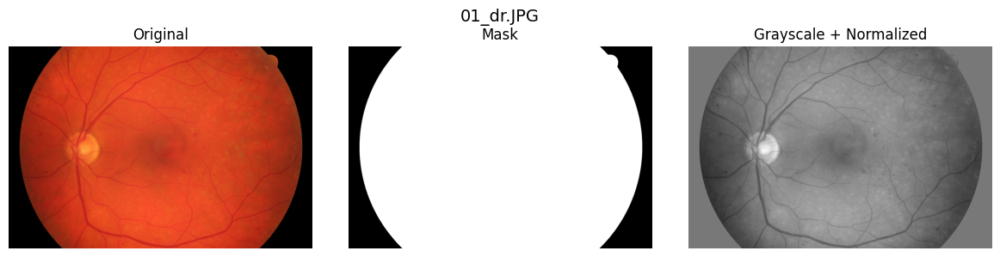

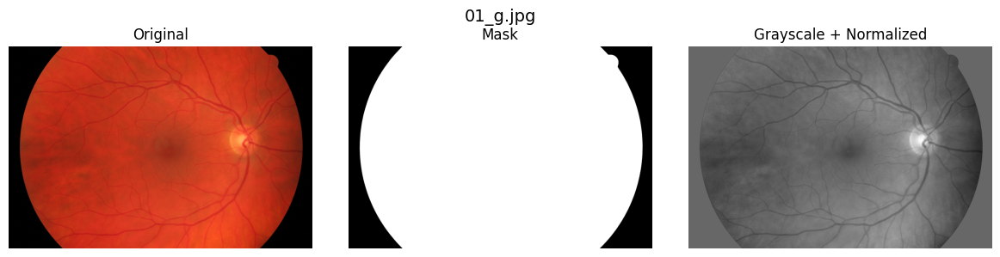

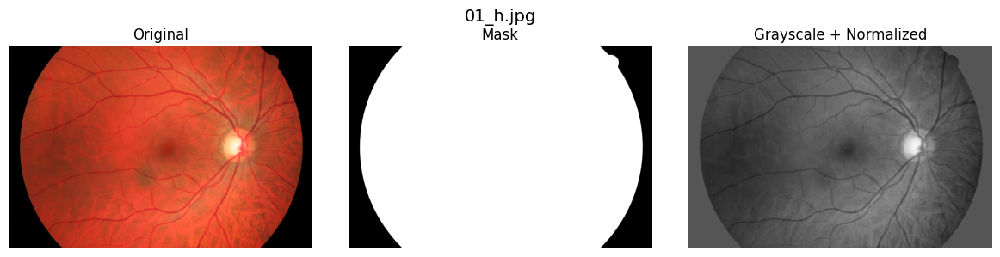

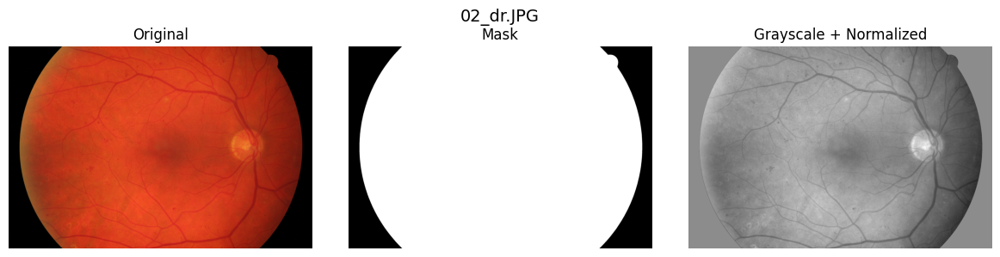

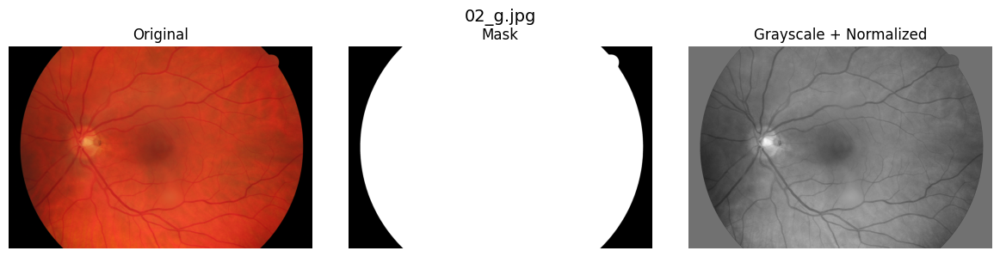

...

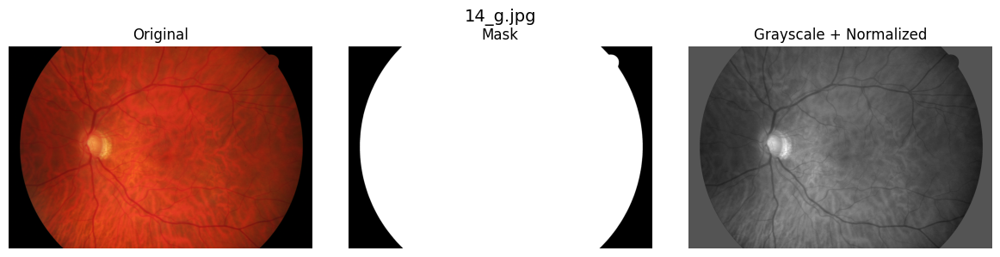

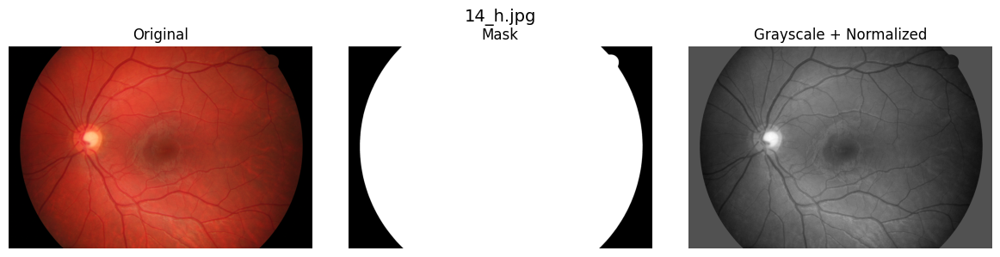

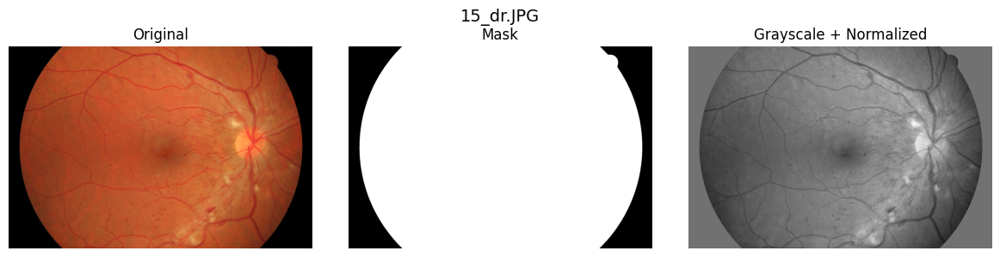

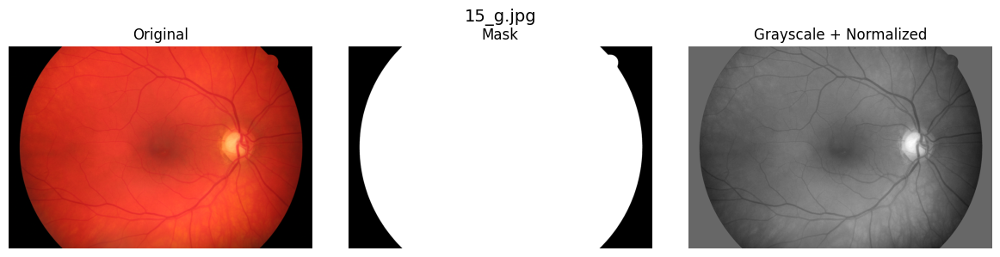

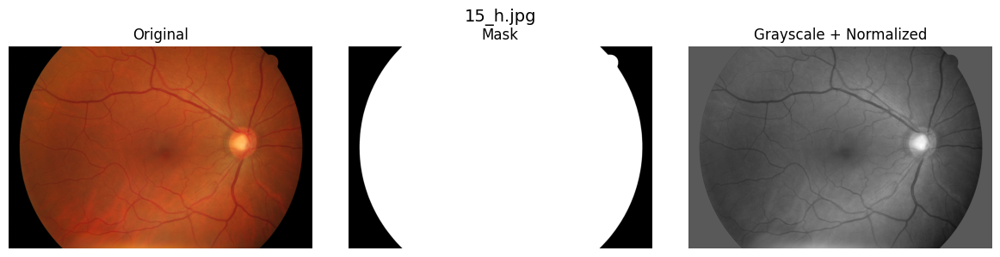

✅ Preprocessed 45 images successfully.


In [3]:
# Install imagecodecs if not already (only in notebook/Jupyter; skip in .py script)
# %pip install imagecodecs

import os
import numpy as np
from skimage.io import imread
from skimage import img_as_float
import matplotlib.pyplot as plt
import tifffile

# -----------------------------------------------------
# Update your paths
IMAGE_ROOT = r'D:\all\images'
MASK_ROOT = r'D:\all\mask'

# STEP 1: Create mapping between image and mask files
image_files = [f for f in os.listdir(IMAGE_ROOT) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
mask_files = [f for f in os.listdir(MASK_ROOT) if f.lower().endswith('.tif')]

def match_mask_filename(img_file):
    # e.g., 03_h.jpg -> 03_h_mask.tif
    base = os.path.splitext(img_file)[0]
    if base.endswith("_mask"):  # skip if already mask
        return None
    mask_candidate = base + '_mask.tif'
    return mask_candidate if mask_candidate in mask_files else None

paired_files = [
    (os.path.join(IMAGE_ROOT, img_file), os.path.join(MASK_ROOT, match_mask_filename(img_file)))
    for img_file in image_files if match_mask_filename(img_file) is not None
]
print(f'Found {len(paired_files)} image-mask pairs.')

# -----------------------------------------------------
# STEP 2: Preprocess
preprocessed_images = []
filenames_used = []

for img_path, mask_path in paired_files:
    # Load image as float
    img = img_as_float(imread(img_path))
    mask = tifffile.imread(mask_path)

    # Ensure mask is 2D
    if mask.ndim == 3:
        mask = mask[..., 0]  # take first channel if RGB

    # Normalize mask to binary float (0 or 1)
    if mask.max() > 1:
        mask = mask / 255.0
    mask = (mask > 0.5).astype(float)

    # If image is RGB, convert to grayscale
    if img.ndim == 3:
        gray = 0.299 * img[..., 0] + 0.587 * img[..., 1] + 0.114 * img[..., 2]
    else:
        gray = img

    # Ensure gray and mask have the same shape
    if gray.shape != mask.shape:
        # Resize or crop mask if it's slightly off (here we just adjust safely)
        min_rows = min(gray.shape[0], mask.shape[0])
        min_cols = min(gray.shape[1], mask.shape[1])
        gray = gray[:min_rows, :min_cols]
        mask = mask[:min_rows, :min_cols]

    # Apply mask to grayscale
    gray_masked = gray * mask

    # Compute normalization only on valid (masked) pixels
    valid_pixels = gray_masked[mask == 1]
    if valid_pixels.size == 0:
        mean, std = 0, 1.0
    else:
        mean = valid_pixels.mean()
        std = valid_pixels.std() if valid_pixels.std() > 0 else 1.0

    # Normalize grayscale image
    gray_norm = np.zeros_like(gray)
    gray_norm[mask == 1] = (gray[mask == 1] - mean) / std

    preprocessed_images.append(gray_norm)
    filenames_used.append(os.path.basename(img_path))

    # --- Visualization (can be commented out for batch processing) ---
    plt.figure(figsize=(12, 3))
    plt.subplot(1, 3, 1); plt.imshow(img, cmap='gray'); plt.title('Original'); plt.axis('off')
    plt.subplot(1, 3, 2); plt.imshow(mask, cmap='gray'); plt.title('Mask'); plt.axis('off')
    plt.subplot(1, 3, 3); plt.imshow(gray_norm, cmap='gray'); plt.title('Grayscale + Normalized'); plt.axis('off')
    plt.suptitle(os.path.basename(img_path), fontsize=14)
    plt.tight_layout(); plt.show()

print(f"✅ Preprocessed {len(preprocessed_images)} images successfully.")

# Optionally, save processed images for use in TDA pipeline:
# os.makedirs(r'D:\all\preprocessed', exist_ok=True)
# for arr, fname in zip(preprocessed_images, filenames_used):
#     np.save(f'D:/all/preprocessed/{fname.replace('.jpg','.npy').replace('.JPG','.npy')}', arr)


In [4]:
import os

save_dir = r'D:\all\preprocessed'
os.makedirs(save_dir, exist_ok=True)

for arr, fname in zip(preprocessed_images, filenames_used):
    # Make a clean filename: replace jpg/JPG with .npy
    npy_name = fname.replace('.jpg', '.npy').replace('.JPG', '.npy').replace('.jpeg', '.npy')
    np.save(os.path.join(save_dir, npy_name), arr)

print(f"Saved {len(preprocessed_images)} arrays to {save_dir}")


Saved 45 arrays to D:\all\preprocessed


In [8]:
import numpy as np
img = np.load(r"D:\all\preprocessed\09_dr.npy")
print(img.shape, img.dtype, img.min(), img.max())


(2336, 3504) float64 -4.088658002133859 4.218830170571913


In [6]:
%pip install --upgrade pip setuptools wheel
%pip install --no-cache-dir dionysus


Defaulting to user installation because normal site-packages is not writeable
  Using cached pip-25.2-py3-none-any.whl.metadata (4.7 kB)
  Using cached setuptools-80.9.0-py3-none-any.whl.metadata (6.6 kB)
Using cached pip-25.2-py3-none-any.whl (1.8 MB)
Using cached setuptools-80.9.0-py3-none-any.whl (1.2 MB)

  Attempting uninstall: setuptools

    Found existing installation: setuptools 75.8.0

    Uninstalling setuptools-75.8.0:

   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ---------------------------------------- 0/2 [setuptools]
   ------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.3.1 which is incompatible.


Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/1.8 MB ? eta -:--:--
     ---------------------------------------- 1.8/1.8 MB 16.6 MB/s  0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py clean for dionysus
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26222 sha256=6a246965de89c9883bbf7b9e088aeb00f3c818e575db1424217b6c78b0a587a4
  Stored in directory: C:\Users\Lakshay Aggarwal\AppData\Local\Temp\pip-ephem-wheel-cache-lwtgku5g\wheels\65\c3\c3\238bf93c243597857edd94ddb0577faa74a8e16e9585896e83
Successfully built intervaltree
Failed to build dionysus
Note: you may need to restart the kernel to use updated packages.


  DEPRECATION: Building 'dionysus' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'dionysus'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [66 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build\lib.win-amd64-cpython-312\dionysus
      copying bindings\python\dionysus\plot.py -> build\lib.win-amd64-cpython-312\dionysus
      copying bindings\python\dionysus\zigzag.py -> build\lib.win-amd64-cpython-312\dionysus
      copying bindings\python\dionysus\_version.py -> build\lib.win-amd64-cpython-312\di

In [7]:
%pip install giotto-tda
from gtda.homology import VietorisRipsPersistence
from gtda.plotting import plot_diagram


  You can safely remove it manually.
  You can safely remove it manually.


Defaulting to user installation because normal site-packages is not writeable
  Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl.metadata (61 kB)
   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.3 MB ? eta -:--:--
   ---------------- ----------------------- 0.5/1.3 MB 2.1 MB/s eta 0:00:01
   --------------------------------- ------ 1.0/1.3 MB 3.1 MB/s eta 0:00:01
   ---------------------------------------- 1.3/1.3 MB 1.8 MB/s  0:00:00
   ---------------------------------------- 0.0/9.1 MB ? eta -:--:--
   ---- ----------------------------------- 1.0/9.1 MB 6.3 MB/s eta 0:00:02
   ---- ----------------------------------- 1.0/9.1 MB 6.3 MB/s eta 0:00:02
   ---------- ----------------------------- 2.4/9.1 MB 3.6 MB/s eta 0:00:02
   ----------------- ---------------------- 3.9/9.1 MB 4.6 MB/s eta 0:00:02
   -------------------------- ------------- 6.0/9.1 MB 5.8 MB/s eta 0:00:01
   ----------------------------------- 

ValueError: numpy.dtype size changed, may indicate binary incompatibility. Expected 96 from C header, got 88 from PyObject

In [8]:
pip uninstall -y giotto-tda scikit-learn numpy


Found existing installation: giotto-tda 0.6.2
Uninstalling giotto-tda-0.6.2:
  Successfully uninstalled giotto-tda-0.6.2
Found existing installation: scikit-learn 1.3.2
Uninstalling scikit-learn-1.3.2:
  Successfully uninstalled scikit-learn-1.3.2
Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Note: you may need to restart the kernel to use updated packages.


You can safely remove it manually.


In [11]:
pip install numpy==1.26.4 scikit-learn==1.4.2 giotto-tda==0.6.0


Defaulting to user installation because normal site-packages is not writeable
  Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl.metadata (61 kB)
  Using cached scikit_learn-1.4.2-cp312-cp312-win_amd64.whl.metadata (11 kB)
Note: you may need to restart the kernel to use updated packages.


ERROR: Ignored the following versions that require a different python version: 1.21.2 Requires-Python >=3.7,<3.11; 1.21.3 Requires-Python >=3.7,<3.11; 1.21.4 Requires-Python >=3.7,<3.11; 1.21.5 Requires-Python >=3.7,<3.11; 1.21.6 Requires-Python >=3.7,<3.11
ERROR: Could not find a version that satisfies the requirement giotto-tda==0.6.0 (from versions: 0.1.4, 0.6.2)
ERROR: No matching distribution found for giotto-tda==0.6.0


In [13]:
from gtda.homology import VietorisRipsPersistence
from gtda.plotting import plot_diagram
print("✅ giotto-tda is working fine!")


ModuleNotFoundError: No module named 'gtda.homology'

In [16]:
%pip install dionysus

import dionysus as d

Defaulting to user installation because normal site-packages is not writeable
  Using cached dionysus-2.1.1.tar.gz (1.8 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached intervaltree-3.1.0-py2.py3-none-any.whl
  Using cached sortedcontainers-2.4.0-py2.py3-none-any.whl.metadata (10 kB)
Using cached sortedcontainers-2.4.0-py2.py3-none-any.whl (29 kB)
  Running setup.py clean for dionysus
Failed to build dionysus
Note: you may need to restart the kernel to use updated packages.


  DEPRECATION: Building 'dionysus' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'dionysus'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [66 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build\lib.win-amd64-cpython-312\dionysus
      copying bindings\python\dionysus\plot.py -> build\lib.win-amd64-cpython-312\dionysus
      copying bindings\python\dionysus\zigzag.py -> build\lib.win-amd64-cpython-312\dionysus
      copying bindings\python\dionysus\_version.py -> build\lib.win-amd64-cpython-312\di

ModuleNotFoundError: No module named 'dionysus'

In [17]:
%pip install gudhi


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/3.4 MB ? eta -:--:--
   ------------ --------------------------- 1.0/3.4 MB 25.4 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   ------------------------ --------------- 2.1/3.4 MB 4.7 MB/s eta 0:00:01
   -------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
giotto-ph 0.2.4 requires scikit-learn>=0.23.1, which is not installed.
librosa 0.11.0 requires scikit-learn>=1.1.0, which is not installed.
sentence-transformers 5.0.0 requires scikit-learn, which is not installed.
numba 0.61.2 requires numpy<2.3,>=1.24, but you have numpy 2.3.3 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.3.3 which is incompatible.


In [5]:
import gudhi as gd
import numpy as np
import matplotlib.pyplot as plt
import os
import numpy as np

load_dir = r'D:\all\preprocessed'
img_files = [f for f in os.listdir(load_dir) if f.endswith('.npy')]
preprocessed_images = [np.load(os.path.join(load_dir, f)) for f in img_files]
filenames_used = img_files  # or restore original names if needed


def gudhi_persistence(image_2d):
    # GUDHI expects float32 arrays
    img = image_2d.astype(np.float32)
    # Lower-star filtration: pass -img so high intensity is birth
    st = gd.CubicalComplex(dimensions=img.shape, top_dimensional_cells=-img)
    st.compute_persistence()
    H0_diag = np.array([pt for pt in st.persistence() if pt[0] == 0])
    H1_diag = np.array([pt for pt in st.persistence() if pt[0] == 1])
    # Convert to birth-death pairs for plotting/statistics
    H0_bdpairs = np.array([bd for _, bd in st.persistence_intervals_in_dimension(0)])
    H1_bdpairs = np.array([bd for _, bd in st.persistence_intervals_in_dimension(1)])
    return H0_bdpairs, H1_bdpairs

# Example for one image:
# img = preprocessed_images[0]
# H0, H1 = gudhi_persistence(img)

for idx, img in enumerate(preprocessed_images):
    H0, H1 = gudhi_persistence(img)
    # Plot persistence diagrams (using scatter)
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    if len(H0) > 0:
        plt.scatter(H0[:,0], H0[:,1], color='blue', label="H0")
    plt.plot([img.min(), img.max()], [img.min(), img.max()], 'r--', alpha=0.4)
    plt.xlabel("Birth"); plt.ylabel("Death"); plt.title(f'H0 {filenames_used[idx]}')
    plt.subplot(1, 2, 2)
    if len(H1) > 0:
        plt.scatter(H1[:,0], H1[:,1], color='green', label="H1")
    plt.plot([img.min(), img.max()], [img.min(), img.max()], 'r--', alpha=0.4)
    plt.xlabel("Birth"); plt.ylabel("Death"); plt.title(f'H1 {filenames_used[idx]}')
    plt.tight_layout(); plt.show()
    # You can save H0, H1 arrays for feature extraction later!



TypeError: only length-1 arrays can be converted to Python scalars

In [6]:
# If you haven't already: install gudhi
# !pip install gudhi

import os
import numpy as np
import gudhi as gd
import matplotlib.pyplot as plt

# ---- 1. Load preprocessed images (.npy files) ----
load_dir = r'D:\all\preprocessed'
img_files = [f for f in os.listdir(load_dir) if f.endswith('.npy')]
preprocessed_images = [np.load(os.path.join(load_dir, f)) for f in img_files]
filenames_used = img_files

# ---- 2. Function: Compute Persistence Diagrams ----
def gudhi_persistence(image_2d):
    # Ensure strictly 2D, float32
    img = np.squeeze(image_2d.astype(np.float32))
    if img.ndim != 2:
        raise ValueError(f"Image must be 2D, got shape {img.shape}")
    st = gd.CubicalComplex(dimensions=img.shape, top_dimensional_cells=-img)
    st.compute_persistence()
    H0_bdpairs = np.array(st.persistence_intervals_in_dimension(0))
    H1_bdpairs = np.array(st.persistence_intervals_in_dimension(1))
    return H0_bdpairs, H1_bdpairs

# ---- 3. Loop: Compute Barcodes + Plot for All Images ----
all_H0 = []
all_H1 = []

for idx, img in enumerate(preprocessed_images):
    img2d = np.squeeze(img)  # Squeeze in case .npy shape is (X,Y,1)
    H0, H1 = gudhi_persistence(img2d)
    all_H0.append(H0)
    all_H1.append(H1)
    # --- Plot persistence diagrams (scatter plots) ---
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    if len(H0) > 0:
        plt.scatter(H0[:,0], H0[:,1], color='blue', label="H0")
    plt.plot([img2d.min(), img2d.max()], [img2d.min(), img2d.max()], 'r--', alpha=0.4)
    plt.xlabel("Birth"); plt.ylabel("Death"); plt.title(f'H0 {filenames_used[idx]}')
    plt.subplot(1, 2, 2)
    if len(H1) > 0:
        plt.scatter(H1[:,0], H1[:,1], color='green', label="H1")
    plt.plot([img2d.min(), img2d.max()], [img2d.min(), img2d.max()], 'r--', alpha=0.4)
    plt.xlabel("Birth"); plt.ylabel("Death"); plt.title(f'H1 {filenames_used[idx]}')
    plt.tight_layout(); plt.show()

# ---- all_H0 and all_H1 now store persistence intervals for each image ----
# Ready for feature extraction, summary stats, or saving.

print(f"Processed {len(preprocessed_images)} images. You now have H0 and H1 diagrams for each.")


TypeError: only length-1 arrays can be converted to Python scalars

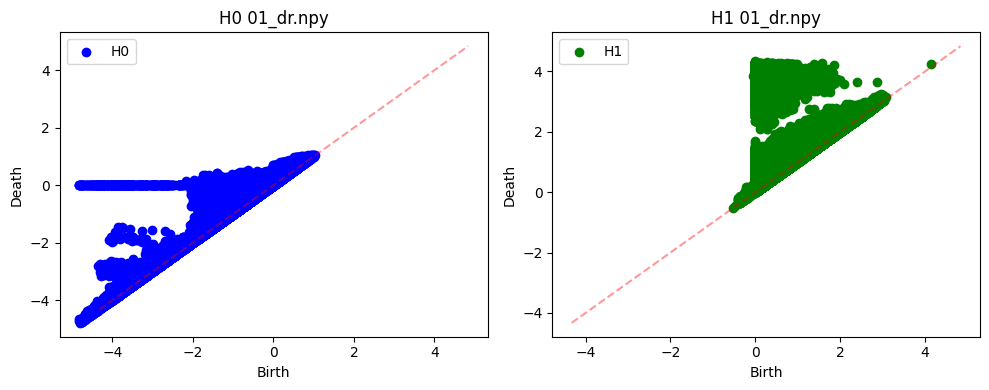

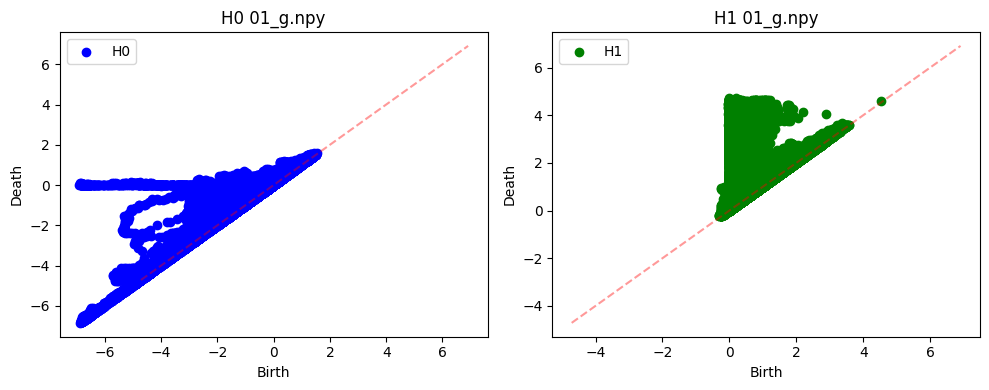

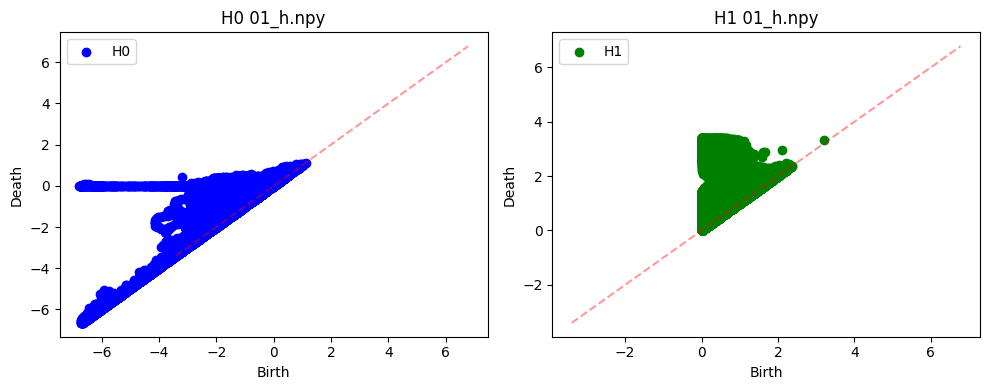

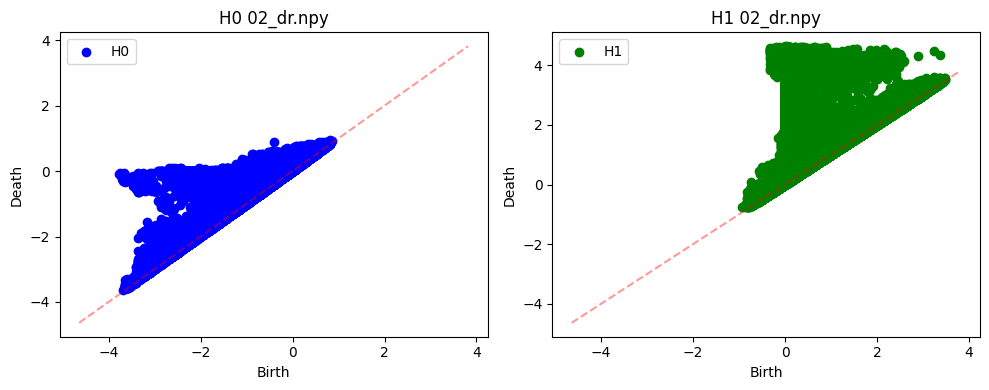

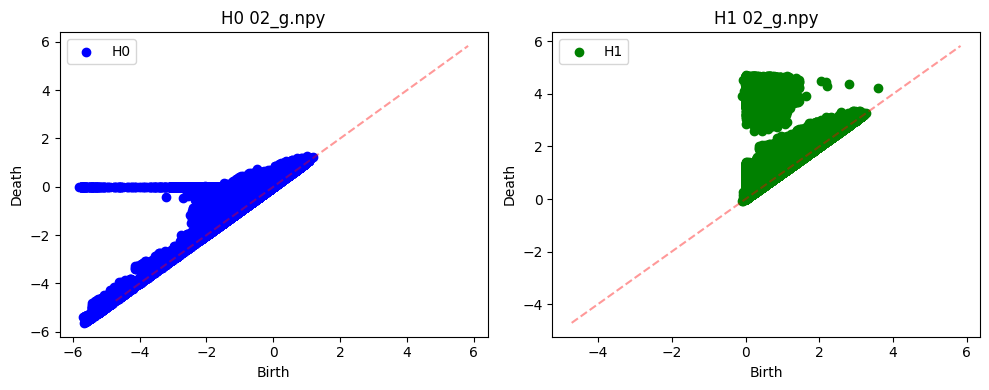

...

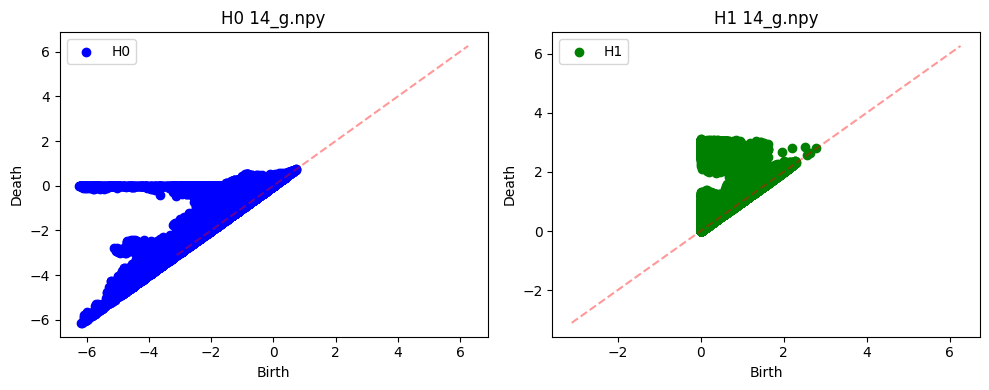

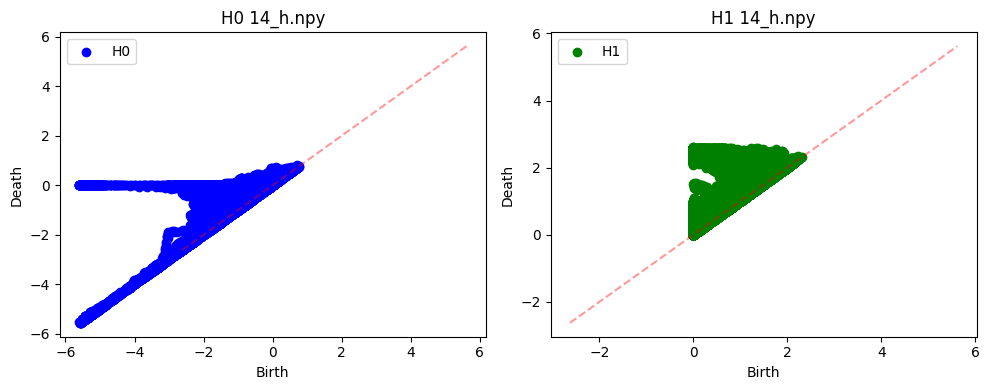

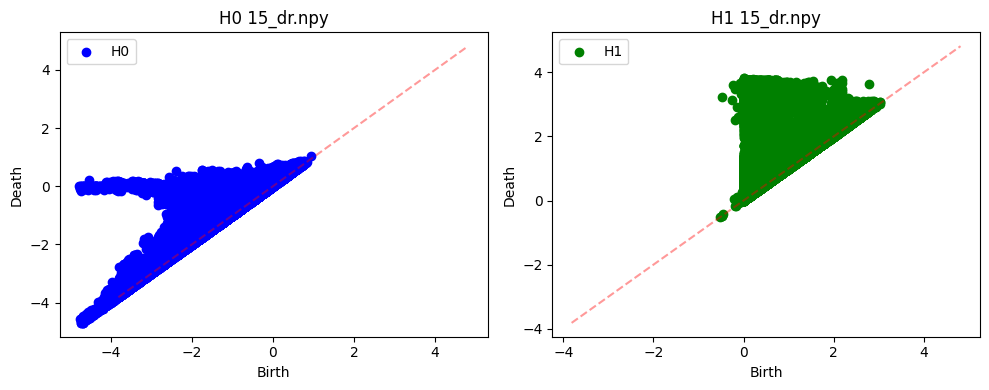

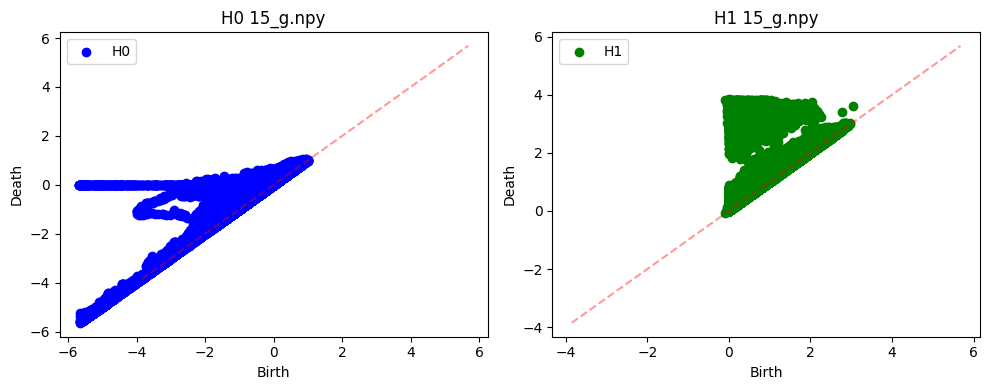

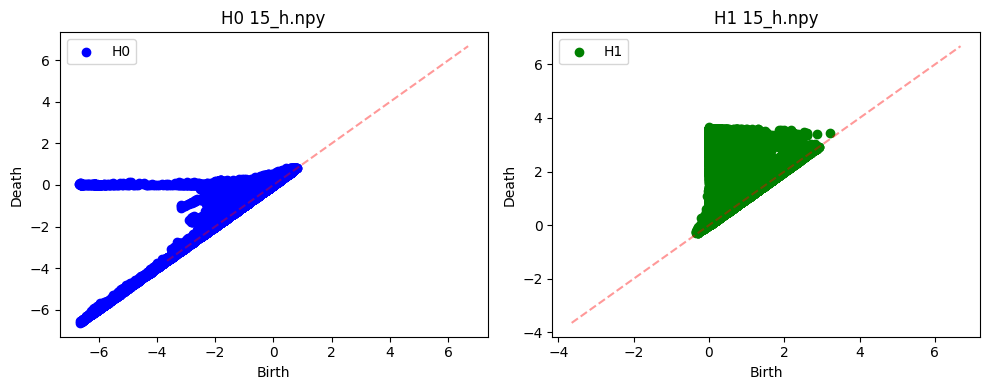

✅ Processed 45 images.
You now have H0 and H1 persistence diagrams for each.


In [7]:
# If you haven't already: install gudhi
# !pip install gudhi

import os
import numpy as np
import gudhi as gd
import matplotlib.pyplot as plt

# ---- 1. Load preprocessed images (.npy files) ----
load_dir = r'D:\all\preprocessed'
img_files = [f for f in os.listdir(load_dir) if f.endswith('.npy')]
preprocessed_images = [np.load(os.path.join(load_dir, f)) for f in img_files]
filenames_used = img_files

# ---- 2. Function: Compute Persistence Diagrams ----
def gudhi_persistence(image_2d):
    # Ensure strictly 2D, float32
    img = np.squeeze(image_2d.astype(np.float32))
    if img.ndim != 2:
        raise ValueError(f"Image must be 2D, got shape {img.shape}")
    
    # Flatten image before passing to CubicalComplex
    st = gd.CubicalComplex(dimensions=img.shape, top_dimensional_cells=-img.ravel())
    st.compute_persistence()

    H0_bdpairs = np.array(st.persistence_intervals_in_dimension(0))
    H1_bdpairs = np.array(st.persistence_intervals_in_dimension(1))
    return H0_bdpairs, H1_bdpairs

# ---- 3. Loop: Compute Barcodes + Plot for All Images ----
all_H0 = []
all_H1 = []

for idx, img in enumerate(preprocessed_images):
    img2d = np.squeeze(img)  # Squeeze in case .npy shape is (X,Y,1)
    H0, H1 = gudhi_persistence(img2d)
    all_H0.append(H0)
    all_H1.append(H1)
    
    # --- Plot persistence diagrams ---
    plt.figure(figsize=(10, 4))
    
    # H0 diagram
    plt.subplot(1, 2, 1)
    if len(H0) > 0:
        plt.scatter(H0[:,0], H0[:,1], color='blue', label="H0")
    plt.plot([img2d.min(), img2d.max()], [img2d.min(), img2d.max()], 'r--', alpha=0.4)
    plt.xlabel("Birth"); plt.ylabel("Death"); plt.title(f'H0 {filenames_used[idx]}')
    plt.legend()

    # H1 diagram
    plt.subplot(1, 2, 2)
    if len(H1) > 0:
        plt.scatter(H1[:,0], H1[:,1], color='green', label="H1")
    plt.plot([img2d.min(), img2d.max()], [img2d.min(), img2d.max()], 'r--', alpha=0.4)
    plt.xlabel("Birth"); plt.ylabel("Death"); plt.title(f'H1 {filenames_used[idx]}')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

print(f"✅ Processed {len(preprocessed_images)} images.")
print("You now have H0 and H1 persistence diagrams for each.")


In [13]:
%pip install scikit-learn

import pandas as pd
import numpy as np
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# ---- 1. Feature extraction from persistence barcodes ----
def summarize_barcode(barcode):
    if len(barcode) == 0:
        # For all values: count, mean life, max life, total pers, mean birth, mean death
        return [0, 0, 0, 0, 0, 0]
    lifetimes = barcode[:,1] - barcode[:,0]
    if len(lifetimes) == 0:
        # Defensive, should not hit
        return [0, 0, 0, 0, 0, 0]
    else:
        return [
            len(lifetimes),                                       # Feature count
            np.nan_to_num(np.mean(lifetimes)),                    # Mean
            np.nan_to_num(np.max(lifetimes)),                     # Max
            np.nan_to_num(np.sum(lifetimes)),                     # Total
            np.nan_to_num(np.mean(barcode[:,0])),                 # Mean birth
            np.nan_to_num(np.mean(barcode[:,1])),                 # Mean death
        ]

# ----- 2. Make table for all images ----
# Labeling: put your ground truth in this list (e.g., 0 = healthy, 1 = DR)
# Assign by filename: here assumes healthy images have '_h' in name, DR '_dr'
labels = []
for fn in filenames_used:
    if '_h' in fn:
        labels.append(0)
    elif '_dr' in fn:
        labels.append(1)
    else:
        labels.append(-1) # flag unknown

data = []
for i in range(len(filenames_used)):
    H0f = summarize_barcode(all_H0[i])
    H1f = summarize_barcode(all_H1[i])
    row = H0f + H1f + [labels[i], filenames_used[i]]
    data.append(row)

df = pd.DataFrame(data, columns=columns)
df = df[df['label']!=-1]  # Remove unclassified images

print(df.head())

# ---- 3. Train/test split, SVM classification, evaluation ----
X = df.iloc[:,:-2].values
y = df['label'].values

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_preds = np.zeros_like(y)

for train_idx, test_idx in skf.split(X, y):
    Xtr, Xte = X[train_idx], X[test_idx]
    ytr, yte = y[train_idx], y[test_idx]
    # You can tune SVM or try LogisticRegressionCV for L1 feature selection!
    clf = SVC(kernel='linear', probability=True)
    clf.fit(Xtr, ytr)
    pred = clf.predict(Xte)
    all_preds[test_idx] = pred

acc = accuracy_score(y, all_preds)
print('Overall accuracy:', acc)
print(classification_report(y, all_preds, target_names=['healthy','DR']))
print('Confusion matrix:\n', confusion_matrix(y, all_preds))


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
   H0_count   H0_mean_life    H0_max_life  H0_total_pers  H0_mean_birth  \
0    550978  1.797693e+308  1.797693e+308  1.797693e+308      -0.874290   
2    428841  1.797693e+308  1.797693e+308  1.797693e+308      -0.959765   
3    540950  1.797693e+308  1.797693e+308  1.797693e+308      -0.861650   
5    426882  1.797693e+308  1.797693e+308  1.797693e+308      -0.927730   
6    501739  1.797693e+308  1.797693e+308  1.797693e+308      -0.916620   

   H0_mean_death  H1_count  H1_mean_life  H1_max_life  H1_total_pers  \
0  1.797693e+308    398493      0.167711     4.327853   66831.460964   
2  1.797693e+308    431530      0.122771     3.402210   52979.463887   
3  1.797693e+308    421373      0.173220     4.906309   72990.299061   
5  1.797693e+308    401226      0.140526     3.839605   56382.834666   
6  1.797693e+308    452192      0.151450     

C:\Users\Lakshay Aggarwal\AppData\Roaming\Python\Python312\site-packages\numpy\_core\_methods.py:170: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


ValueError: The dual coefficients or intercepts are not finite. The input data may contain large values and need to be preprocessed.

In [14]:
import pandas as pd
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

# --------------------------------------------------
def summarize_barcode(barcode):
    # Defensive against empty and nan/inf
    if len(barcode) == 0:
        return [0, 0, 0, 0, 0, 0]
    lifetimes = barcode[:,1] - barcode[:,0]
    return [
        len(lifetimes),
        np.nan_to_num(np.mean(lifetimes), nan=0, posinf=0, neginf=0),
        np.nan_to_num(np.max(lifetimes), nan=0, posinf=0, neginf=0) if len(lifetimes) > 0 else 0,
        np.nan_to_num(np.sum(lifetimes), nan=0, posinf=0, neginf=0),
        np.nan_to_num(np.mean(barcode[:,0]), nan=0, posinf=0, neginf=0),
        np.nan_to_num(np.mean(barcode[:,1]), nan=0, posinf=0, neginf=0)
    ]

columns = [
    'H0_count','H0_mean_life','H0_max_life','H0_total_pers','H0_mean_birth','H0_mean_death',
    'H1_count','H1_mean_life','H1_max_life','H1_total_pers','H1_mean_birth','H1_mean_death',
    'label','filename'
]

# Assign labels (0 = healthy, 1 = DR)
labels = []
for fn in filenames_used:
    if '_h' in fn:
        labels.append(0)
    elif '_dr' in fn:
        labels.append(1)
    else:
        labels.append(-1)

data = []
for i in range(len(filenames_used)):
    H0f = summarize_barcode(all_H0[i])
    H1f = summarize_barcode(all_H1[i])
    row = H0f + H1f + [labels[i], filenames_used[i]]
    data.append(row)

df = pd.DataFrame(data, columns=columns)
df = df[df['label'] != -1]  # Remove unknowns

# --- Prepare feature matrix ---
X = df.iloc[:,:-2].values
y = df['label'].values

# --- Clean/sanitize features ---
X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
X = np.clip(X, -1000, 1000)
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Optional: debug feature stats
print("Feature min/max:", np.min(X), np.max(X))
print("Any inf?", np.isinf(X).any(), "Any nan?", np.isnan(X).any())

# --- ML flow ---
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
all_preds = np.zeros_like(y)

for train_idx, test_idx in skf.split(X, y):
    Xtr, Xte = X[train_idx], X[test_idx]
    ytr, yte = y[train_idx], y[test_idx]
    clf = SVC(kernel='linear', probability=True, random_state=42)
    clf.fit(Xtr, ytr)
    pred = clf.predict(Xte)
    all_preds[test_idx] = pred

print('Overall accuracy:', accuracy_score(y, all_preds))
print(classification_report(y, all_preds, target_names=['healthy','DR']))
print('Confusion matrix:\n', confusion_matrix(y, all_preds))


Feature min/max: -2.0057059443722602 2.2852893887862242
Any inf? False Any nan? False
Overall accuracy: 0.7333333333333333
              precision    recall  f1-score   support

     healthy       0.68      0.87      0.76        15
          DR       0.82      0.60      0.69        15

    accuracy                           0.73        30
   macro avg       0.75      0.73      0.73        30
weighted avg       0.75      0.73      0.73        30

Confusion matrix:
 [[13  2]
 [ 6  9]]
